In [ ]:
# Install gdown if not already installed
!pip install gdown --quiet

In [ ]:
!pip install pyheif pillow pillow-heif

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.3/5.3 MB 73.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.6/7.6 MB 92.9 MB/s eta 0:00:00


In [ ]:
!pip install pillow pillow-avif-plugin

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.7/14.7 MB 88.0 MB/s eta 0:00:00


In [ ]:
!apt-get update
!apt-get install -y libavif-dev libheif-dev imagemagick
!pip install pillow pillow-avif-plugin pyheif

Get:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease [3,626 B]
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:3 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:4 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Get:5 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease [127 kB]
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 https://r2u.stat.illinois.edu/ubuntu jammy/main amd64 Packages [2,618 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,512 kB]
Get:13 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,5

In [ ]:
import os
from PIL import Image
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim
import matplotlib.pyplot as plt
import pillow_heif
pillow_heif.register_avif_opener()

In [ ]:
!pip install pyheif pillow pillow-heif

In [ ]:
!pip install pillow pillow-avif-plugin

In [ ]:
from PIL import Image

# Test for AVIF support
try:
    print("AVIF support:", "AVIF" in Image.SAVE)
except Exception as e:
    print(f"Error testing AVIF support: {e}")

# Test for WebP support
try:
    print("WebP support:", "WEBP" in Image.SAVE)
except Exception as e:
    print(f"Error testing WebP support: {e}")


AVIF support: True
WebP support: True


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**Downloaing the test Image (input_image.png) from Public Google Drive Link**

In [ ]:
import gdown

# Google Drive file ID
file_id = "1KQp4AWlzht8MziSuilUq-r1cSFE52cXX"
output_file = "input_image.png"  # Name for the downloaded image

# Construct the download URL and download the image
url = f"https://drive.google.com/uc?id={file_id}"
gdown.download(url, output_file, quiet=False)


Downloading...
From: https://drive.google.com/uc?id=1KQp4AWlzht8MziSuilUq-r1cSFE52cXX
To: /content/input_image.png
100%|██████████| 9.09M/9.09M [00:00<00:00, 145MB/s]


'input_image.png'

Displaying the Image and Size before the Compression

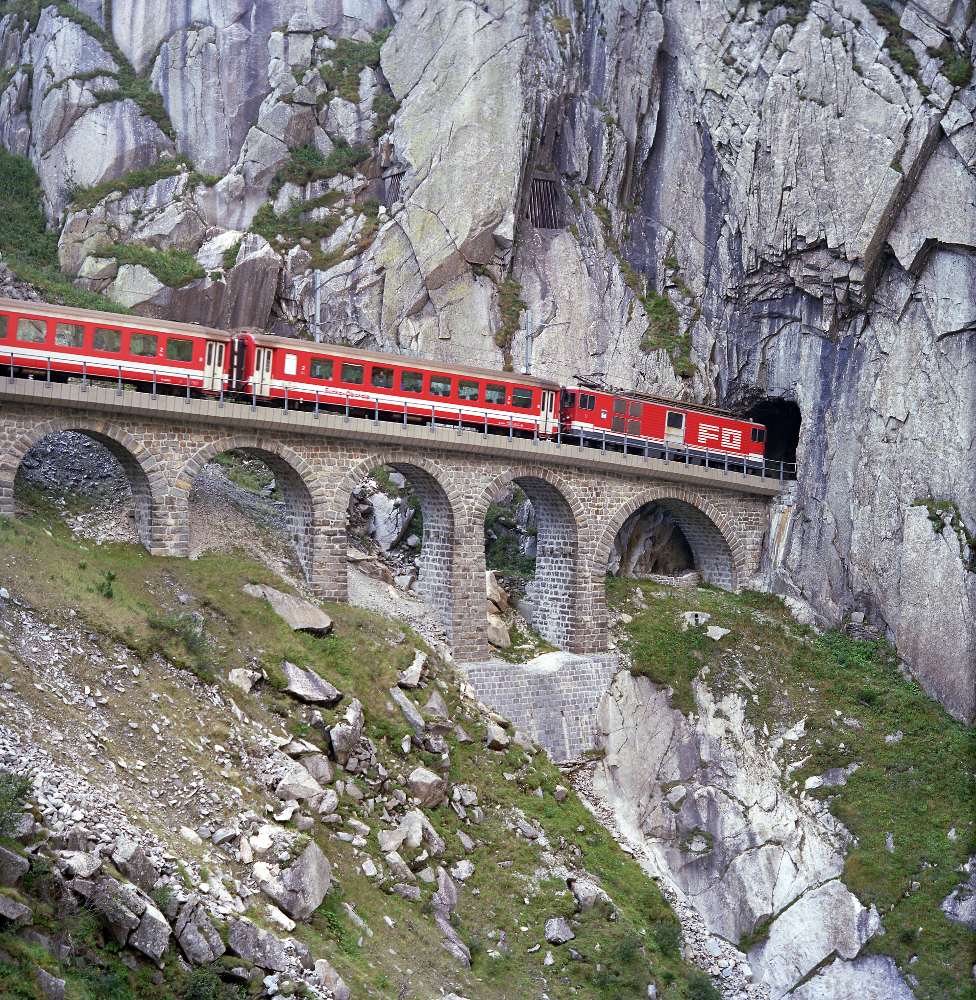

In [ ]:
from PIL import Image
from IPython.display import display

# Load the image
original_image = Image.open(output_file)

# Display the image inline
display(original_image)


In [ ]:
# Calculate and display file size on disk
file_size_bytes = os.path.getsize(output_file)
file_size_mb = file_size_bytes / (1024 * 1024)  # Convert to MB
print(f"Image size before compression: {file_size_mb:.2f} MB")

Image size before compression: 8.67 MB


In [ ]:
# Create an output directory
OUTPUT_DIR = "Compressed_Images"
os.makedirs(OUTPUT_DIR, exist_ok=True)

# Compression formats and quality settings
FORMATS = ["JPEG2000", "PNG", "JPEG", "AVIF", "WebP"]
QUALITY_SETTINGS = {"JPEG": 85, "AVIF": 85, "WebP": 85}  # Quality for lossy formats


In [ ]:
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr, structural_similarity as ssim

# Function to calculate PSNR and SSIM metrics
def calculate_metrics(original, compressed):
    original_np = np.array(original)
    compressed_np = np.array(compressed)

    # Calculate PSNR
    psnr_value = psnr(original_np, compressed_np, data_range=original_np.max() - original_np.min())

    # Adjust win_size for SSIM calculation
    min_dim = min(original_np.shape[:2])
    win_size = min(7, min_dim)
    if win_size % 2 == 0:
        win_size -= 1
    win_size = max(3, win_size)

    # Calculate SSIM
    ssim_value = ssim(
        original_np, compressed_np, multichannel=True, channel_axis=-1, win_size=win_size
    )
    return psnr_value, ssim_value

# Function to compress and save images
def compress_and_save(img, format, output_path, quality=None):
    if format == "JPEG2000":
        img.save(output_path, format="JPEG2000", quality_mode="lossy")
    elif format == "PNG":
        img.save(output_path, format="PNG", optimize=True, compress_level=9)
    elif format == "JPEG":
        img.save(output_path, format="JPEG", quality=quality, optimize=True)
    elif format == "AVIF":
        img.save(output_path, format="AVIF", quality=quality)
    elif format == "WebP":
        img.save(output_path, format="WebP", quality=quality, method=6)
    else:
        raise ValueError(f"Unsupported format: {format}")


In [ ]:
import time

# Original file size in bytes
original_size_bytes = os.path.getsize(output_file)
original_size_mb = original_size_bytes / (1024 * 1024)  # Convert to MB

# Initialize results list
results = []

for fmt in FORMATS:
    # Determine the file extension
    ext = "jp2" if fmt == "JPEG2000" else fmt.lower()
    output_path = os.path.join(OUTPUT_DIR, f"input_compressed.{ext}")

    # Measure compression time
    start_compression = time.time()
    if fmt in QUALITY_SETTINGS:
        compress_and_save(original_image, fmt, output_path, quality=QUALITY_SETTINGS[fmt])
    else:
        compress_and_save(original_image, fmt, output_path)
    end_compression = time.time()

    # Load the compressed image and measure decoding time
    start_decoding = time.time()
    compressed_image = Image.open(output_path)
    compressed_image.load()  # Ensure the image is fully loaded
    end_decoding = time.time()

    # Calculate PSNR and SSIM
    psnr_value, ssim_value = calculate_metrics(original_image, compressed_image)

    # Calculate compressed file size
    compressed_size_bytes = os.path.getsize(output_path)
    compressed_size_mb = compressed_size_bytes / (1024 * 1024)  # Convert to MB

    # Calculate compression ratio
    compression_ratio = original_size_bytes / compressed_size_bytes

    # Append results
    results.append((
        fmt,
        original_size_mb,
        compressed_size_mb,
        compression_ratio,
        psnr_value,
        ssim_value,
        end_compression - start_compression,  # Compression time
        end_decoding - start_decoding         # Decoding time
    ))
    print(f"{fmt}: Size = {compressed_size_mb:.2f} MB, Compression Ratio = {compression_ratio:.2f}, "
          f"PSNR = {psnr_value:.2f}, SSIM = {ssim_value:.4f}, "
          f"Compression Time = {end_compression - start_compression:.4f}s, "
          f"Decoding Time = {end_decoding - start_decoding:.4f}s")


/usr/local/lib/python3.10/dist-packages/skimage/metrics/simple_metrics.py:168: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range**2) / err)


JPEG2000: Size = 8.34 MB, Compression Ratio = 1.04, PSNR = inf, SSIM = 1.0000, Compression Time = 5.6746s, Decoding Time = 3.8566s
PNG: Size = 8.63 MB, Compression Ratio = 1.00, PSNR = inf, SSIM = 1.0000, Compression Time = 1.1521s, Decoding Time = 0.1353s
JPEG: Size = 1.38 MB, Compression Ratio = 6.26, PSNR = 30.54, SSIM = 0.9354, Compression Time = 0.0875s, Decoding Time = 0.0574s
AVIF: Size = 1.89 MB, Compression Ratio = 4.59, PSNR = 33.67, SSIM = 0.9682, Compression Time = 5.1442s, Decoding Time = 0.5731s
WebP: Size = 1.39 MB, Compression Ratio = 6.25, PSNR = 32.13, SSIM = 0.9553, Compression Time = 3.2511s, Decoding Time = 0.2223s


In [ ]:
import pandas as pd

# Define column names for the DataFrame
columns = [
    "Format",
    "Original Size (MB)",
    "Compressed Size (MB)",
    "Compression Ratio",
    "PSNR",
    "SSIM",
    "Compression Time (s)",
    "Decoding Time (s)"
]

# Convert results into a DataFrame
df_results = pd.DataFrame(results, columns=columns)

# display the DataFrame as a table in Jupyter/Colab
import IPython.display as ipd
ipd.display(df_results)


,Format,Original Size (MB),Compressed Size (MB),Compression Ratio,PSNR,SSIM,Compression Time (s),Decoding Time (s)
0,JPEG2000,8.666288,8.336967,1.039501,inf,1.000000,5.674625,3.856609
1,PNG,8.666288,8.633045,1.003851,inf,1.000000,1.152145,0.135285
2,JPEG,8.666288,1.384642,6.258867,30.541239,0.935427,0.087471,0.057424
3,AVIF,8.666288,1.888012,4.590166,33.667666,0.968239,5.144233,0.573118
4,WebP,8.666288,1.386801,6.249123,32.127900,0.955350,3.251119,0.222342


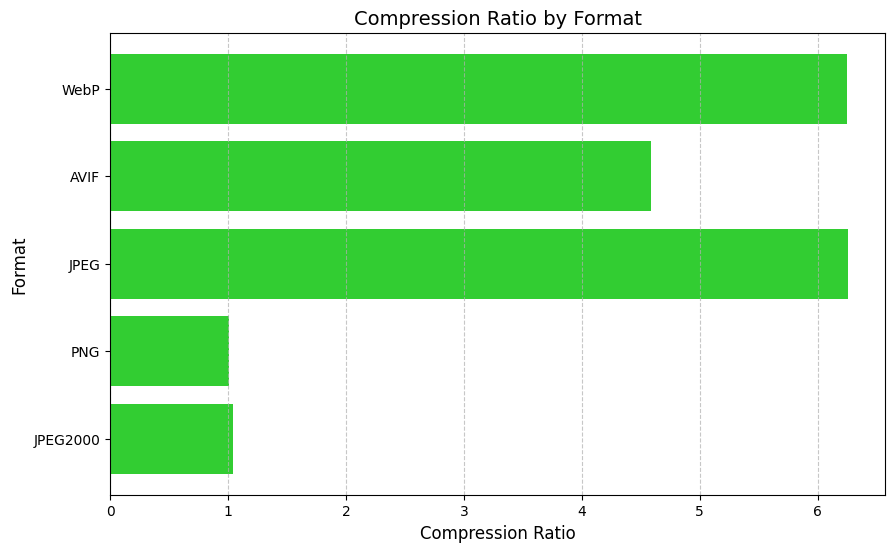

In [ ]:
# Horizontal bar chart for compression ratio
plt.figure(figsize=(10, 6))
plt.barh(df_results["Format"], df_results["Compression Ratio"], color="limegreen")
plt.title("Compression Ratio by Format", fontsize=14)
plt.xlabel("Compression Ratio", fontsize=12)
plt.ylabel("Format", fontsize=12)
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()


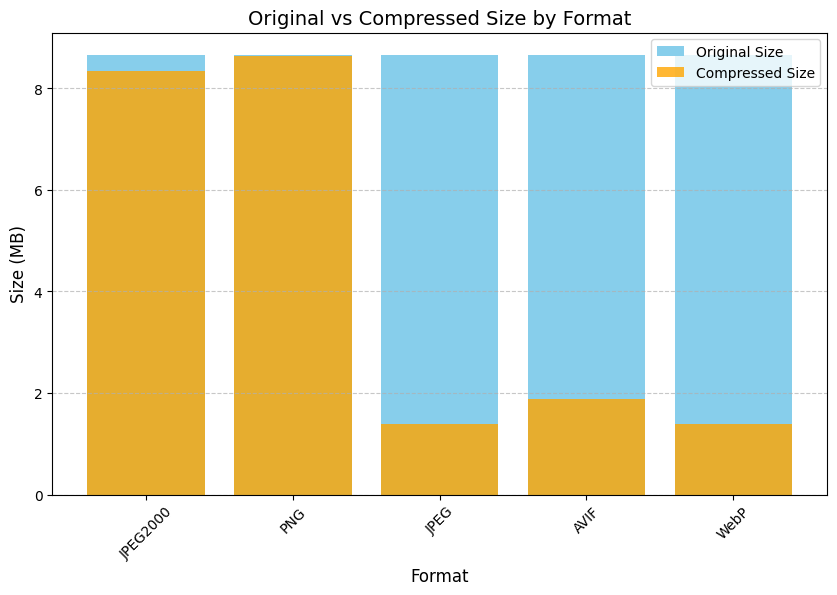

In [ ]:
# Stacked bar chart for original vs compressed size
plt.figure(figsize=(10, 6))
plt.bar(df_results["Format"], df_results["Original Size (MB)"], label="Original Size", color="skyblue")
plt.bar(df_results["Format"], df_results["Compressed Size (MB)"], label="Compressed Size", color="orange", alpha=0.8)
plt.title("Original vs Compressed Size by Format", fontsize=14)
plt.xlabel("Format", fontsize=12)
plt.ylabel("Size (MB)", fontsize=12)
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.7)
plt.xticks(rotation=45)
plt.show()


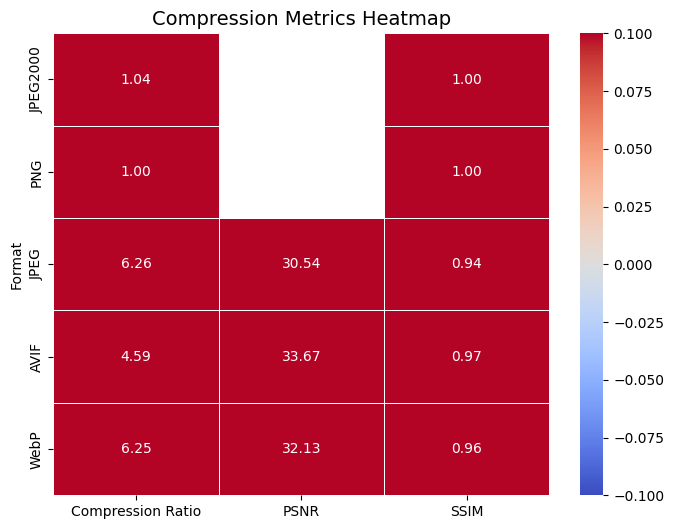

In [ ]:
import seaborn as sns

# Prepare a smaller DataFrame for the heatmap
heatmap_data = df_results[["Format", "Compression Ratio", "PSNR", "SSIM"]].set_index("Format")

# Create the heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_data, annot=True, fmt=".2f", cmap="coolwarm", linewidths=0.5)
plt.title("Compression Metrics Heatmap", fontsize=14)
plt.show()


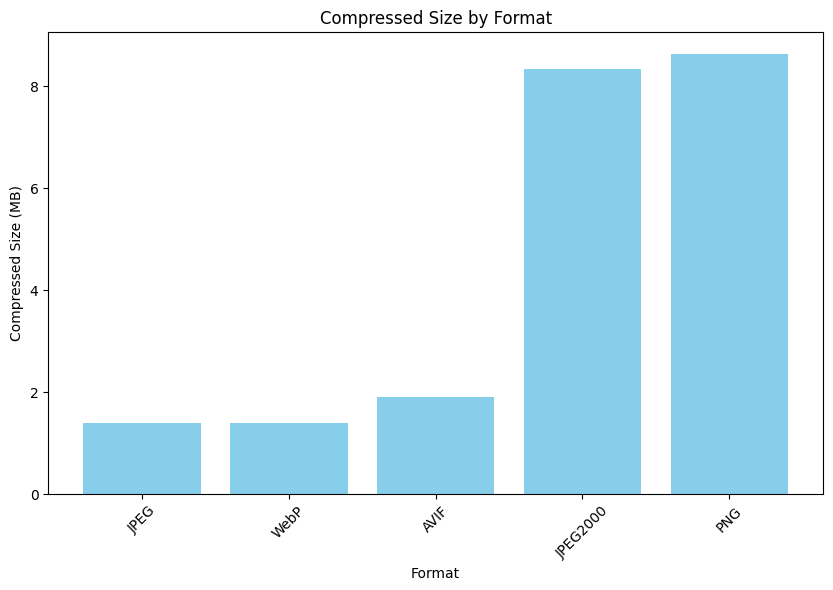

In [ ]:
# Bar chart for compressed sizes
df_results.sort_values("Compressed Size (MB)", inplace=True)
plt.figure(figsize=(10, 6))
plt.bar(df_results["Format"], df_results["Compressed Size (MB)"], color="skyblue")
plt.title("Compressed Size by Format")
plt.xlabel("Format")
plt.ylabel("Compressed Size (MB)")
plt.xticks(rotation=45)
plt.show()

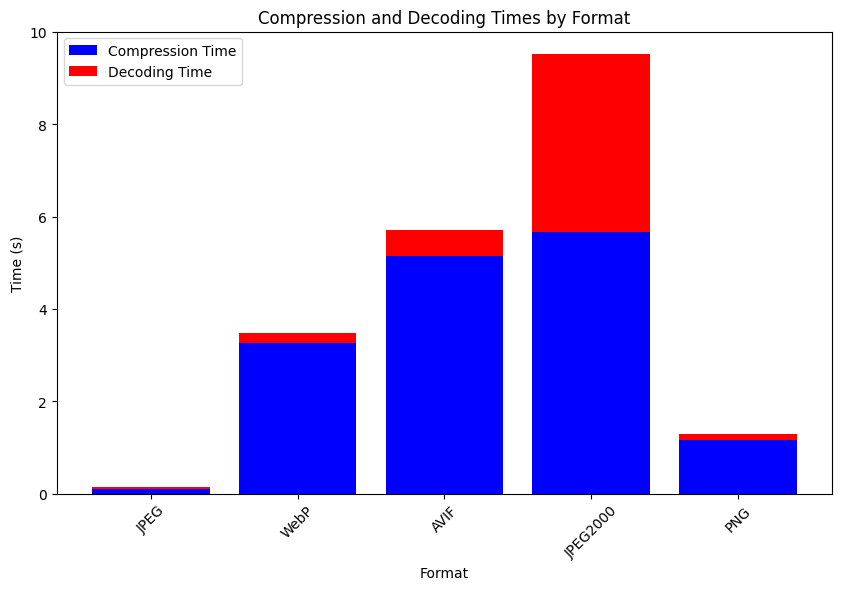

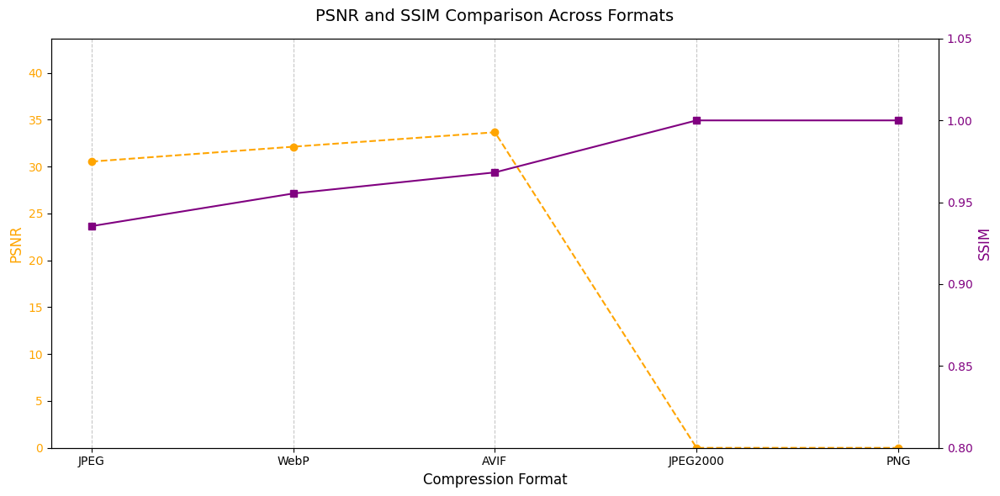

In [ ]:
# Handle NaN or inf in PSNR and SSIM
df_results["PSNR"] = df_results["PSNR"].replace([np.inf, -np.inf], np.nan).fillna(0)
df_results["SSIM"] = df_results["SSIM"].fillna(0)

# Combined Visualization: PSNR and SSIM Comparison (Dual Y-Axis)
fig, ax1 = plt.subplots(figsize=(12, 6))

# Plot PSNR on the primary y-axis
ax1.plot(df_results["Format"], df_results["PSNR"], color="orange", marker="o", linestyle="--", label="PSNR")
ax1.set_ylabel("PSNR", color="orange", fontsize=12)
ax1.tick_params(axis="y", labelcolor="orange", labelsize=10)
ax1.set_ylim(0, df_results["PSNR"].max() + 10)  # Adjust y-axis limits for clarity

# Add secondary y-axis for SSIM
ax2 = ax1.twinx()
ax2.plot(df_results["Format"], df_results["SSIM"], color="purple", marker="s", linestyle="-", label="SSIM")
ax2.set_ylabel("SSIM", color="purple", fontsize=12)
ax2.tick_params(axis="y", labelcolor="purple", labelsize=10)
ax2.set_ylim(0.8, 1.05)  # SSIM values typically range from 0 to 1

# Set title and x-axis labels
plt.title("PSNR and SSIM Comparison Across Formats", fontsize=14, pad=15)
ax1.set_xlabel("Compression Format", fontsize=12)
plt.xticks(rotation=45, fontsize=10)

# Add grid for better readability
ax1.grid(axis="x", linestyle="--", alpha=0.7)

# Ensure layout fits neatly
plt.tight_layout()

# Display the plot
plt.show()


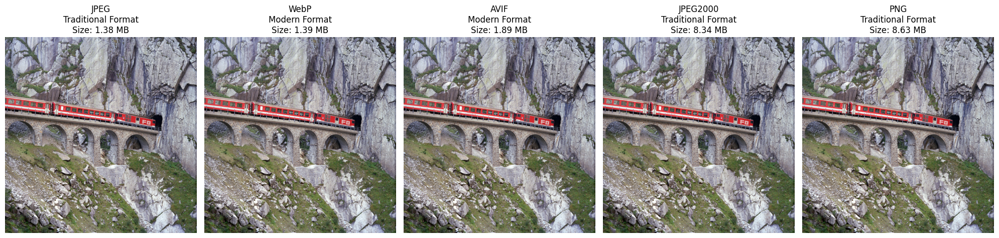

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

# Categorize formats
modern_formats = ["WebP", "AVIF"]
traditional_formats = ["JPEG", "PNG", "JPEG2000"]

# Load images and their details
compressed_images = []
for fmt in df_results["Format"]:
    ext = "jp2" if fmt == "JPEG2000" else fmt.lower()
    file_path = os.path.join(OUTPUT_DIR, f"input_compressed.{ext}")
    compressed_images.append((Image.open(file_path), fmt))

# Create a grid layout for displaying images
fig, axes = plt.subplots(1, 5, figsize=(20, 10))

for ax, (img, fmt) in zip(axes, compressed_images):
    # Show the image
    ax.imshow(img)
    ax.axis('off')  # Hide axes

    # Get compressed size and category
    size_mb = df_results.loc[df_results["Format"] == fmt, "Compressed Size (MB)"].values[0]
    category = "Modern" if fmt in modern_formats else "Traditional"

    # Add annotation
    ax.set_title(f"{fmt}\n{category} Format\nSize: {size_mb:.2f} MB", fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


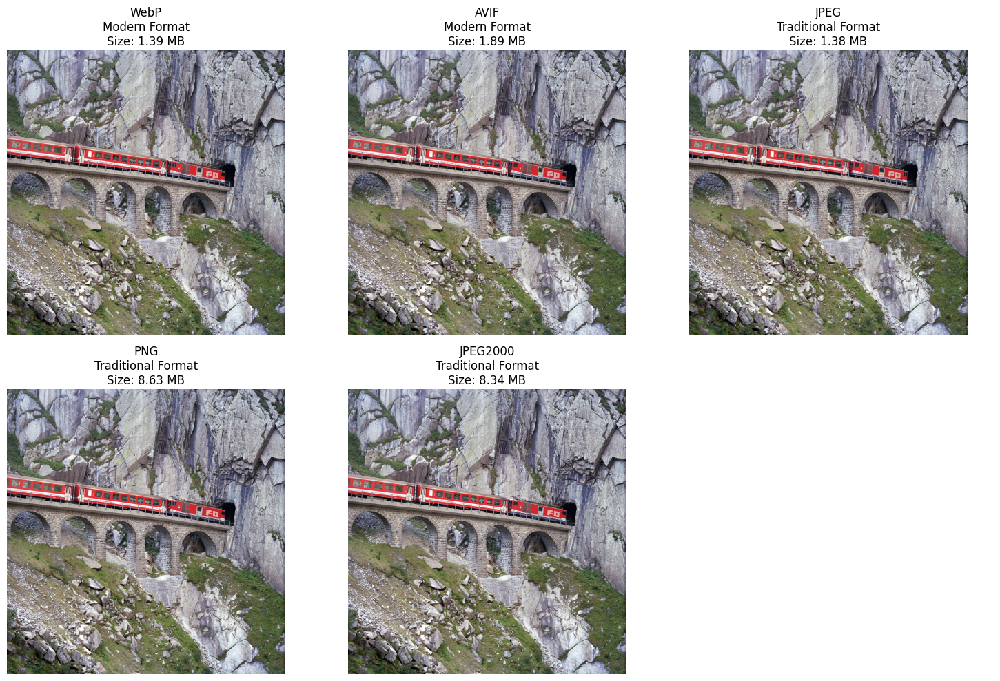

In [ ]:
# Categorize formats
modern_formats = ["WebP", "AVIF"]
traditional_formats = ["JPEG", "PNG", "JPEG2000"]

# Separate images by category
modern_images = [
    (Image.open(os.path.join(OUTPUT_DIR, f"input_compressed.{fmt.lower()}")), fmt)
    for fmt in modern_formats
]
traditional_images = [
    (Image.open(os.path.join(OUTPUT_DIR, f"input_compressed.{('jp2' if fmt == 'JPEG2000' else fmt.lower())}")), fmt)
    for fmt in traditional_formats
]

# Combine modern and traditional images
all_images = modern_images + traditional_images

# Create a grid layout (2 rows, variable columns)
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

for i, ax in enumerate(axes.flat):
    if i < len(all_images):
        img, fmt = all_images[i]
        # Show the image
        ax.imshow(img)
        ax.axis("off")  # Hide axes

        # Get compressed size and category
        size_mb = df_results.loc[df_results["Format"] == fmt, "Compressed Size (MB)"].values[0]
        category = "Modern" if fmt in modern_formats else "Traditional"

        # Add title below the image
        ax.set_title(f"{fmt}\n{category} Format\nSize: {size_mb:.2f} MB", fontsize=12)
    else:
        # Hide empty subplot
        ax.axis("off")

# Adjust layout
plt.tight_layout()
plt.show()
